參考資料
https://gist.github.com/tigercosmos/90a5664a3b698dc9a4c72bc0fcbd21f4

In [24]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import random
from tqdm.notebook import tqdm
plt.rcParams['figure.figsize'] = [15, 15]

In [25]:
# Read image and convert them to gray!!
def read_image(path):
    img = cv2.imread(path)
    img_gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img_gray, img, img_rgb

In [26]:

left_gray, left_origin, left_rgb = read_image('../data/book1.jpg')
right_gray, right_origin, right_rgb = read_image('../data/scene.jpg')

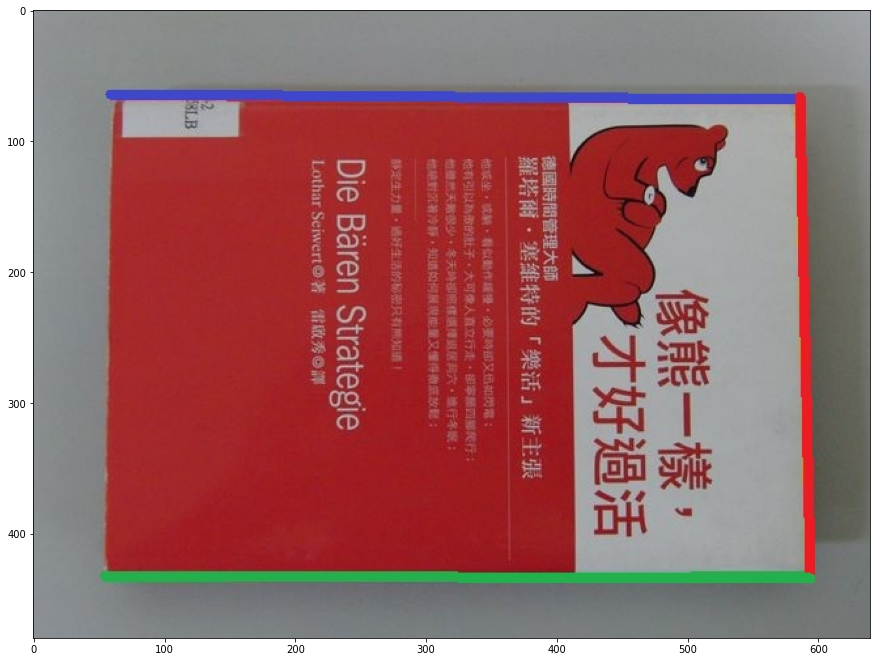

In [150]:
plt.title
plt.imshow(left_rgb)

In [73]:
def SIFT(img):
    siftDetector= cv2.xfeatures2d.SIFT_create() # limit 1000 points
    # siftDetector= cv2.SIFT_create()  # depends on OpenCV version

    kp, des = siftDetector.detectAndCompute(img, None)
    return kp, des

def plot_sift(gray, rgb, kp):
    tmp = rgb.copy()
    img = cv2.drawKeypoints(gray, kp, tmp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    return img

In [74]:
# Better result when using gray
kp_left, des_left = SIFT(left_gray)
kp_right, des_right = SIFT(right_gray)

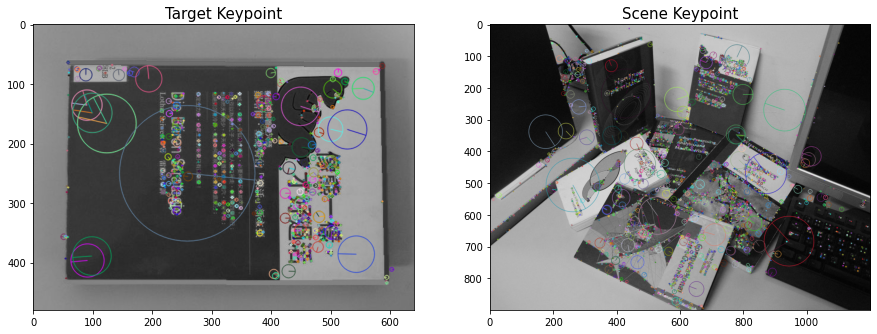

In [68]:
kp_left_img = plot_sift(left_gray, left_rgb, kp_left)
kp_right_img = plot_sift(right_gray, right_rgb, kp_right)
#total_kp = np.concatenate((kp_left_img, kp_right_img), axis=1)
plt.subplot(1,2,1)
plt.title('Target Keypoint', fontsize = 15)
plt.imshow(kp_left_img)
plt.subplot(1,2,2)
plt.title('Scene Keypoint', fontsize = 15)
plt.imshow(kp_right_img)

In [32]:
def matcher(kp1, des1, img1, kp2, des2, img2, threshold):
    # BFMatcher with default params
    bf = cv2.BFMatcher()
    matches = bf.knnMatch(des1,des2, k=2)

    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance < threshold*n.distance:
            good.append([m])

    matches = []
    for pair in good:
        matches.append(list(kp1[pair[0].queryIdx].pt + kp2[pair[0].trainIdx].pt))

    matches = np.array(matches)
    return matches

In [75]:
left_rgb.shape

(480, 640, 3)

In [33]:
matches = matcher(kp_left, des_left, left_rgb, kp_right, des_right, right_rgb, 0.5)

In [166]:
def plot_matches(matches, left_rgb, right_rgb, txt):
    fig  = np.zeros((right_rgb.shape[0], left_rgb.shape[1],3))
    fig[0:left_rgb.shape[0], 0:left_rgb.shape[1],:] = left_rgb
    total_img = np.concatenate((fig, right_rgb), axis=1)
    match_img = total_img.copy()
    offset = left_rgb.shape[1]
    fig, ax = plt.subplots()
    ax.set_aspect('equal')
    ax.set_title(txt, fontsize=20)
    ax.imshow(np.array(match_img).astype('uint8')) #　RGB is integer type
    
    ax.plot(matches[:, 0], matches[:, 1], 'xr')
    ax.plot(matches[:, 2] + offset, matches[:, 3], 'xr')
     
    ax.plot([matches[:, 0], matches[:, 2] + offset], [matches[:, 1], matches[:, 3]],
            'r', linewidth=0.5)
    plt.savefig(txt+'.png', bbox_inches='tight', pad_inches=0)

    plt.show()

In [164]:
left_rgb.shape, right_rgb.shape, left_rgb.shape[0], right_rgb.shape[1]

((480, 640, 3), (900, 1200, 3), 480, 1200)

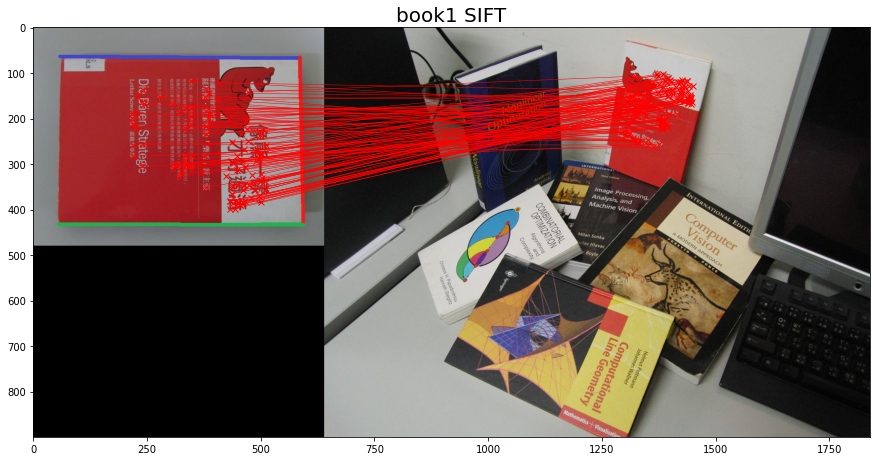

In [169]:
book = 'book1'
plot_matches(matches, left_rgb, right_rgb, book+'_SIFT') # Good mathces

In [141]:
def homography(pairs):
    rows = []
    for i in range(pairs.shape[0]):
        p1 = np.append(pairs[i][0:2], 1)
        p2 = np.append(pairs[i][2:4], 1)
        row1 = [0, 0, 0, p1[0], p1[1], p1[2], -p2[1]*p1[0], -p2[1]*p1[1], -p2[1]*p1[2]]
        row2 = [p1[0], p1[1], p1[2], 0, 0, 0, -p2[0]*p1[0], -p2[0]*p1[1], -p2[0]*p1[2]]
        rows.append(row1)
        rows.append(row2)
    rows = np.array(rows)
    U, s, V = np.linalg.svd(rows)
    H = V[-1].reshape(3, 3)
    H = H/H[2, 2] # standardize to let w*H[2,2] = 1
    return H

In [142]:
def random_point(matches, k=4):
    idx = random.sample(range(len(matches)), k)
    point = [matches[i] for i in idx ]
    return np.array(point)

In [143]:
def get_error(points, H):
    num_points = len(points)
    all_p1 = np.concatenate((points[:, 0:2], np.ones((num_points, 1))), axis=1)
    all_p2 = points[:, 2:4]
    estimate_p2 = np.zeros((num_points, 2))
    for i in range(num_points):
        temp = np.dot(H, all_p1[i])
        estimate_p2[i] = (temp/temp[2])[0:2] # set index 2 to 1 and slice the index 0, 1
    # Compute error
    errors = np.linalg.norm(all_p2 - estimate_p2 , axis=1) ** 2

    return errors

In [144]:
def ransac(matches, threshold, iters):
    num_best_inliers = 0
    
    for i in range(iters):
        points = random_point(matches)
        H = homography(points)
        
        #  avoid dividing by zero 
        if np.linalg.matrix_rank(H) < 3:
            continue
            
        errors = get_error(matches, H)
        idx = np.where(errors < threshold)[0]
        inliers = matches[idx]

        num_inliers = len(inliers)
        if num_inliers > num_best_inliers:
            best_inliers = inliers.copy()
            num_best_inliers = num_inliers
            best_H = H.copy()
            
    print("inliers/matches: {}/{}".format(num_best_inliers, len(matches)))
    return best_inliers, best_H

In [145]:
inliers, H = ransac(matches, 0.5, 2000)

inliers/matches: 112/119


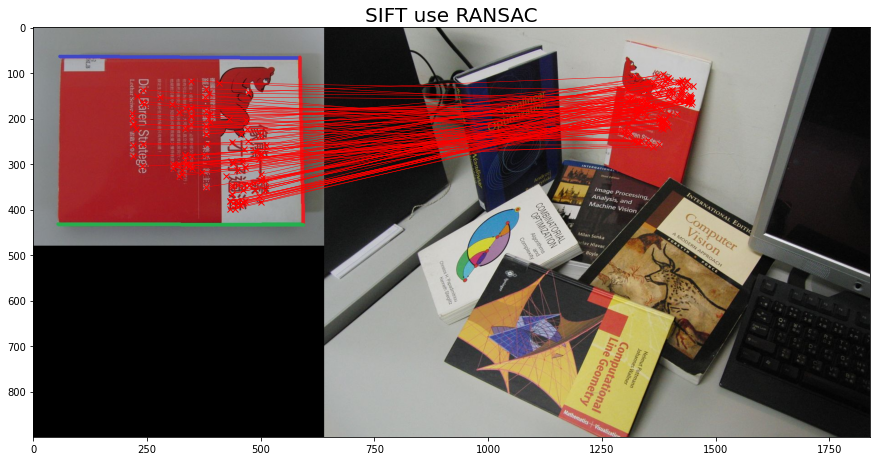

In [156]:
plot_matches(inliers, left_rgb, right_rgb, book+'SIFT_use_RANSAC') # show inliers matches

In [182]:
def Do_SIFT(target_path, scene_path, book):
    left_gray, left_origin, left_rgb = read_image(target_path)
    right_gray, right_origin, right_rgb = read_image(scene_path)
    
    # Better result when using gray
    kp_left, des_left = SIFT(left_gray)
    kp_right, des_right = SIFT(right_gray)
    kp_left_img = plot_sift(left_gray, left_rgb, kp_left)
    kp_right_img = plot_sift(right_gray, right_rgb, kp_right)
       
    #plt.subplot(1,2,1)
    plt.title(book+' Keypoint', fontsize = 15)
    plt.imshow(kp_left_img)
    plt.savefig(book+'_kp.png', bbox_inches='tight', pad_inches=0)
    
    #plt.subplot(1,2,2)
    plt.title('Scene Keypoint', fontsize = 15)
    plt.imshow(kp_right_img)
    plt.savefig('Scene_kp.png', bbox_inches='tight', pad_inches=0)
    
    matches = matcher(kp_left, des_left, left_rgb, kp_right, des_right, right_rgb, 0.5)
    plot_matches(matches, left_rgb, right_rgb, book+'_SIFT') # Good mathces
    
    inliers, H = ransac(matches, 0.5, 2000)
    plot_matches(inliers, left_rgb, right_rgb, book+'_SIFT_use_RANSAC') # show inliers matches

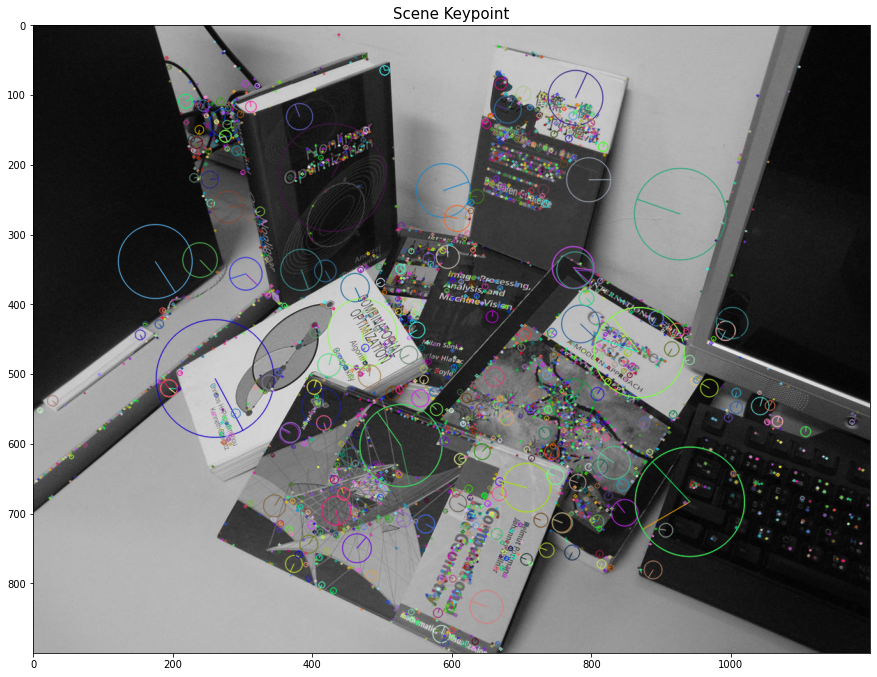

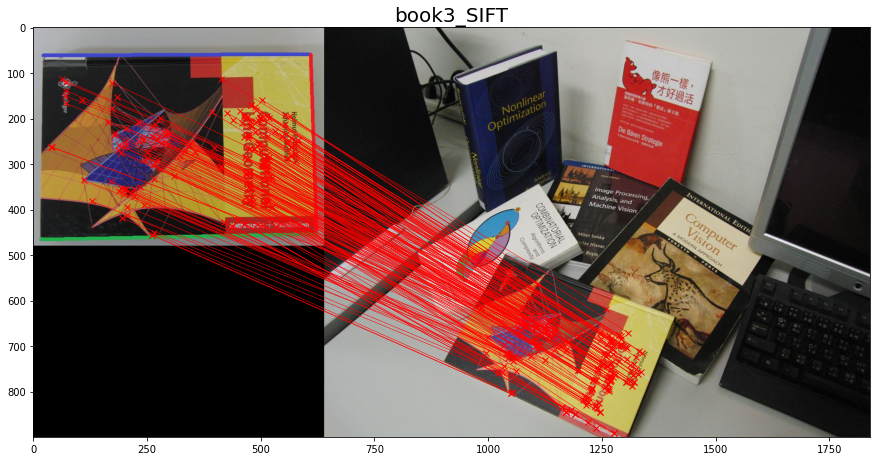

inliers/matches: 155/185


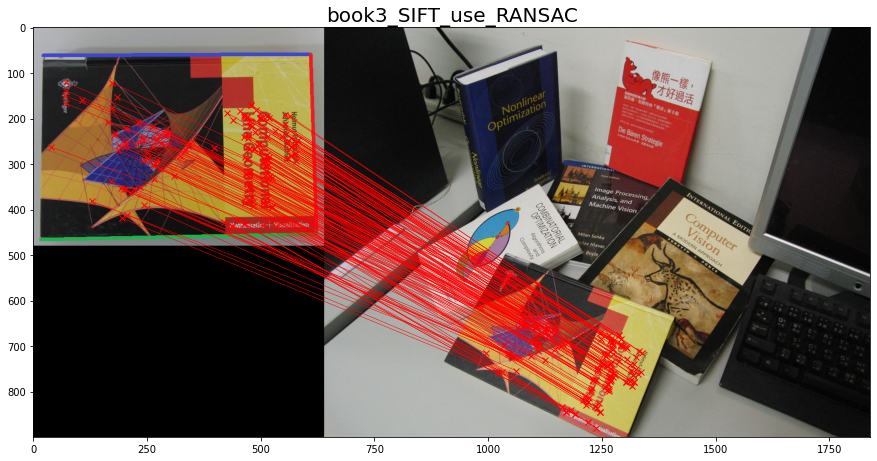

In [186]:
book = 'book3'
target_path = '../data/book3.jpg'
scene_path = '../data/scene.jpg'

Do_SIFT(target_path, scene_path, book)
    

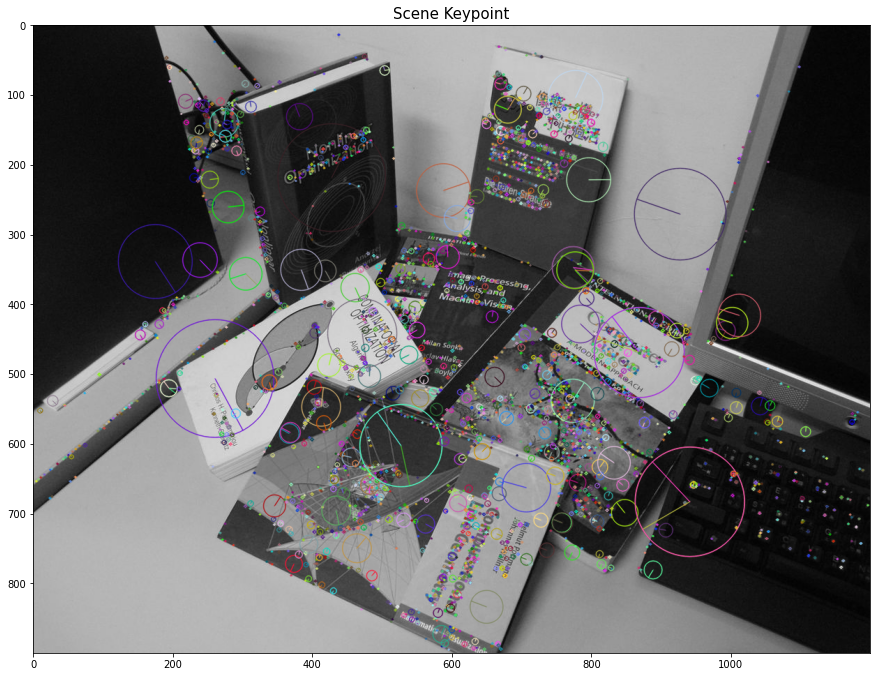

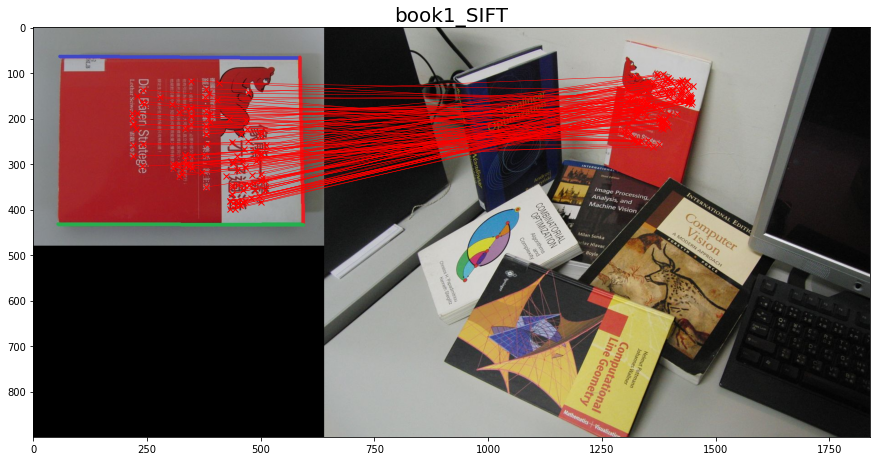

inliers/matches: 112/119


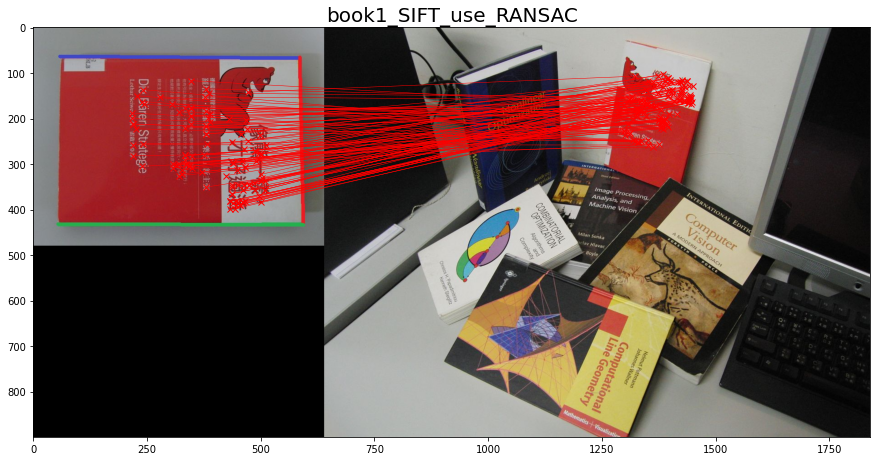

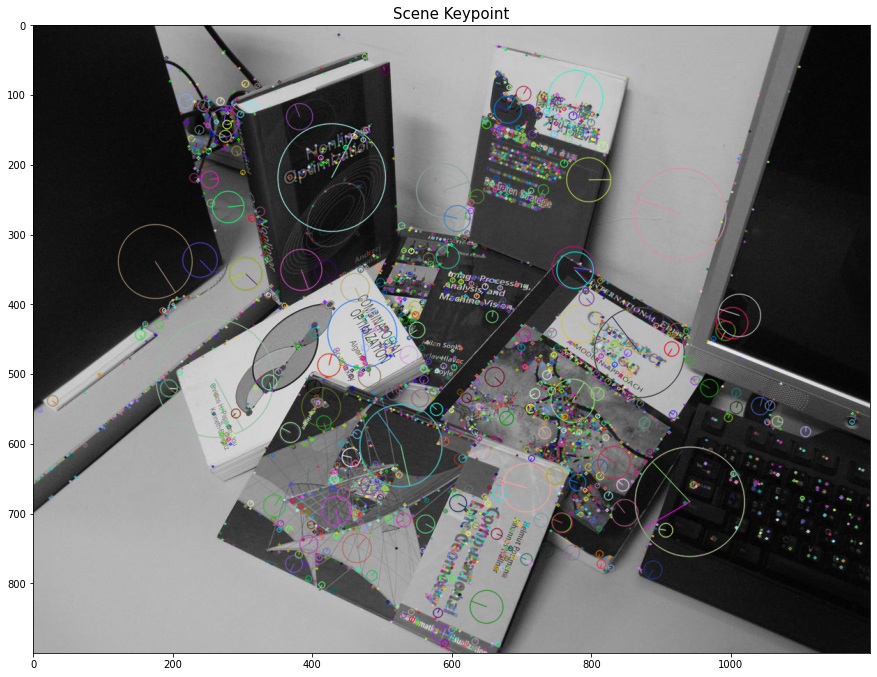

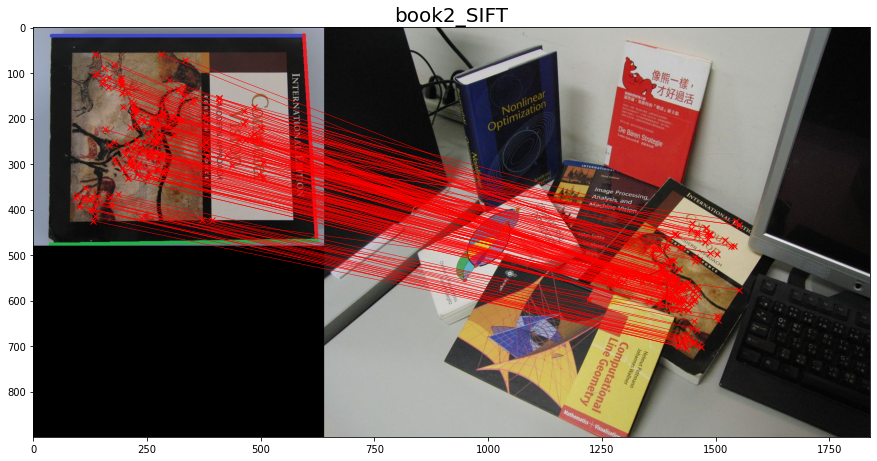

inliers/matches: 129/185


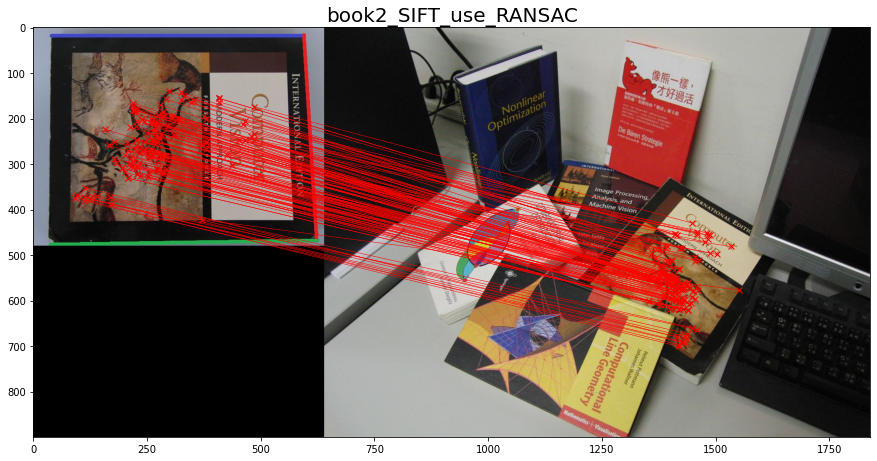

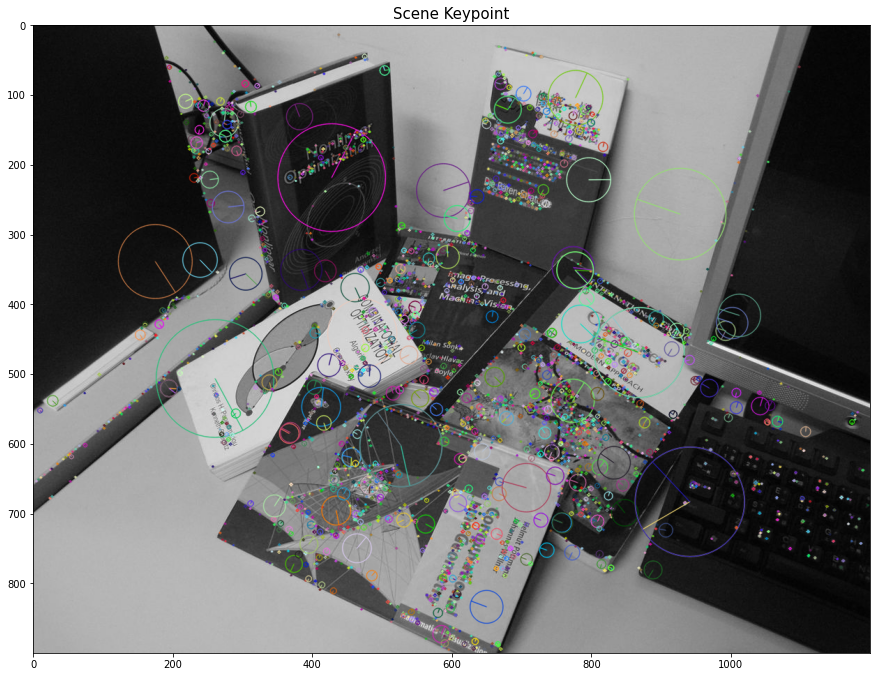

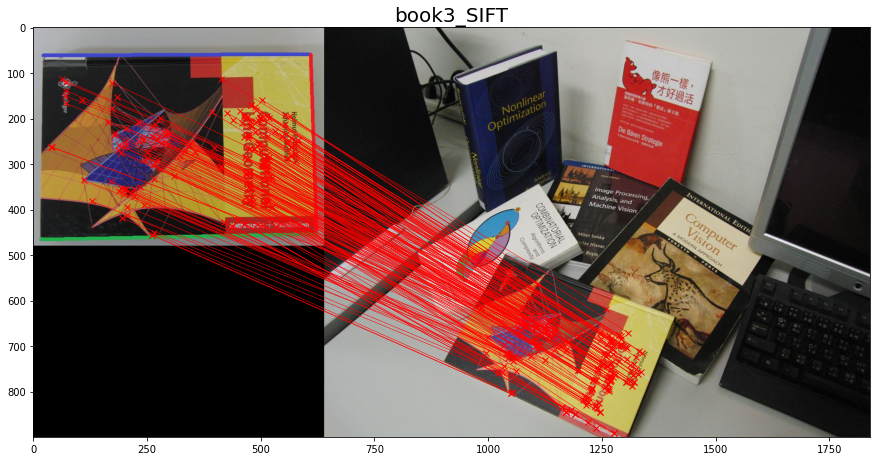

inliers/matches: 156/185


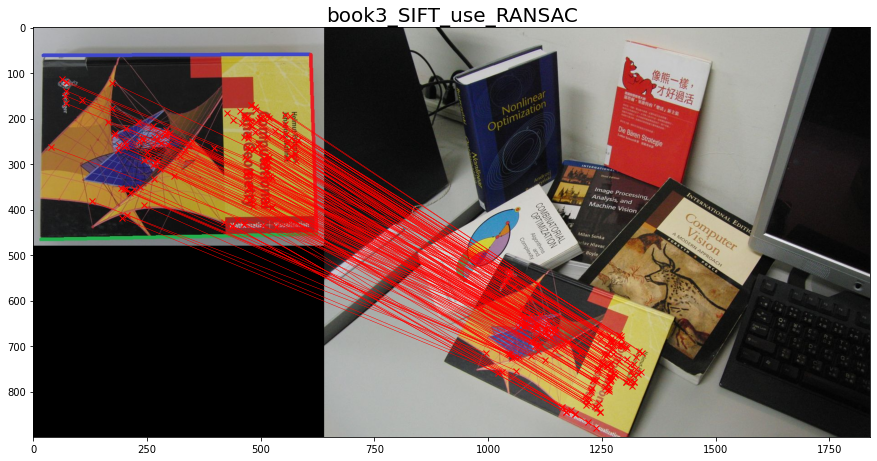

In [183]:
books = ['book1', 'book2', 'book3']
target_path = ['../data/book1.jpg', '../data/book2.jpg', '../data/book3.jpg']
scene_path = ['../data/scene.jpg', '../data/scene.jpg', '../data/scene.jpg']
for book, target_path, scene_path in zip(books, target_path, scene_path):
    Do_SIFT(target_path, scene_path, book)